In [3]:
!pip install open3d

     --------------------------------------- 62.3/62.3 MB 12.8 MB/s eta 0:00:00
     ---------------------------------------- 75.3/75.3 kB 2.1 MB/s eta 0:00:00
     ---------------------------------------- 9.9/9.9 MB 16.7 MB/s eta 0:00:00
  Using cached dash_html_components-2.0.0-py3-none-any.whl (4.1 kB)
     ---------------------------------------- 101.8/101.8 kB ? eta 0:00:00
  Using cached dash_table-5.0.0-py3-none-any.whl (3.9 kB)
  Using cached dash_core_components-2.0.0-py3-none-any.whl (3.8 kB)
     ------------------------------------- 233.6/233.6 kB 14.9 MB/s eta 0:00:00
  Using cached itsdangerous-2.1.2-py3-none-any.whl (15 kB)
  Attempting uninstall: nbformat
    Found existing installation: nbformat 5.7.0
    Uninstalling nbformat-5.7.0:
      Successfully uninstalled nbformat-5.7.0


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [13]:
# set root dir
root_dir = "C:/Users\gunho\PycharmProjects\CV-ML-demonstration\image analysis\ex1\imgs\d3"

img_ind = [5095, 5324, 5334, 5349, 5442, 5449, 5632, 5641, 5722, 5879, 5902, 6195, 6299, 6335, 6382, 6412]
rgbs = []
depths = []

#loading of rgbs and depth maps
for i in img_ind:
    rgb = cv2.imread(os.path.join(root_dir, "rgb", "img_" + str(i) + ".png"))
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
    rgbs.append(rgb)
    depth = cv2.imread(os.path.join(root_dir, "depth", "img_" + str(i) + ".png"), -1)
    depth = np.asarray(depth, dtype=np.float32)
    depths.append(depth / 1000.0)

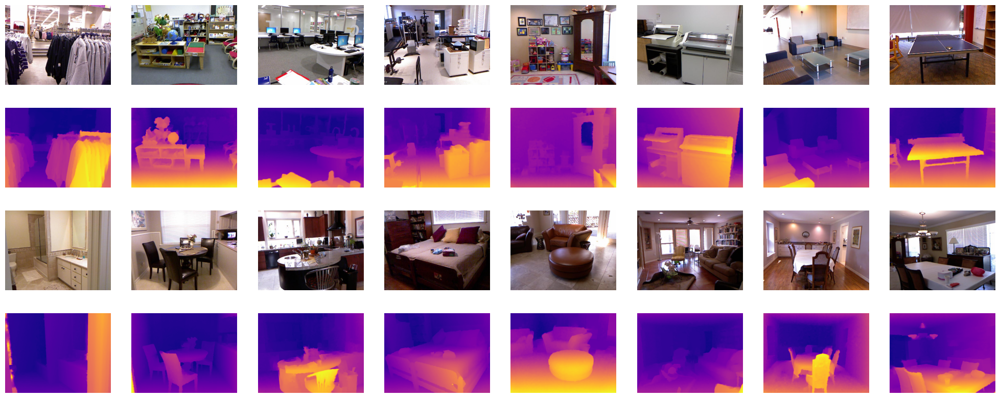

In [14]:
#visualize images using matplotlib
fig = plt.figure(figsize=(25.00, 10.0))
for i in range(0, len(rgbs)):
    plt.subplot(4, 8, i + (i // 8) * 8 + 1)
    plt.axis("off")
    plt.imshow(rgbs[i])
    plt.subplot(4, 8, i + ((i // 8 + 1) * 8) + 1)
    plt.axis("off")
    plt.imshow(1. / depths[i], cmap="plasma")


In [15]:
fx = 5.1885790117450188e+02
fy = 5.1946961112127485e+02
cx = 3.2558244941119034e+02 - 40
cy = 2.5373616633400465e+02 - 44

# create intrinsic matrix K and its inverse K_inv. Using np.eye and np.linalg.inv
K = np.eye(3)
K[0, 0] = fx
K[0, 2] = cx
K[1, 1] = fy
K[1, 2] = cy

K_inv = np.linalg.inv(K)



In [16]:
# get the image size h, w. It is the same for all images
h, w, _ = rgbs[0].shape

# create a set of points in homogeneous coordinates points2d 3 x Npixels: (x, y, 1)
# e.g., [[0, 0, 1], [0, 1, 1], [0, 2, 1]...]
#First, use np.linspace, np.meshgrid, np.ones_like, np.stack to get the array of shape (h, w, 3); 
xv = np.linspace(0, w - 1, w)
yv = np.linspace(0, h - 1, h)
xx, yy = np.meshgrid(xv, yv)

# combine x, y and add ones
points2d = np.stack([xx, yy, np.ones_like(xx)], axis=2)

# np.reshape and np.transpose to match the shape of (3, img_height * img_width)
points2d = np.reshape(points2d, (h * w, 3))
points2d = np.transpose(points2d)

# convert to image plane coordinates with inverse of intrinsics: K_inv * points2d. Use np.matmul
points_imgpln = np.matmul(K_inv, points2d)

#For each image:
points3D = []
for i in range(0, len(depths)):
    # reshape depths to (img_height * img_width)
    depth_flattened_i = np.reshape(depths[i], (h * w))
    
    # get 3D points via multiplying the points on the image plane 
    # by the corresponding depth values 
    p3d_temp = points_imgpln * depth_flattened_i
    
    # append the transposed result (shape = (h*w, 3) ) to the list
    points3D.append(np.transpose(p3d_temp))

points3D_colored = []
for i in range(0, len(rgbs)):
    # flatten rgb images to match shape (h*w, 3) 
    color_flattened_i = np.reshape(rgbs[i], (h * w, 3))
    
    # create array of colored points by concatenating color information to the corresponding points3D 
    # use np.concatenate
    # the result should have shape (h*w, 6), last dim is x-y-z-r-g-b
    color3d_tmp = np.concatenate([points3D[i], color_flattened_i], axis=1)
 
    # append the result to the list
    points3D_colored.append(color3d_tmp)

In [17]:
#visualize point cloud(s) (optional section, cn't run this without open3d)
cloud = o3d.geometry.PointCloud()
index2vis = 1
cloud.points = o3d.utility.Vector3dVector(points3D_colored[index2vis][:, :3])
cloud.colors = o3d.utility.Vector3dVector(points3D_colored[index2vis][:, 3:] / 255.0)

o3d.visualization.draw_geometries([cloud])

In [18]:
# create a 3D transformation matrix M (3x4), lets say with z translation -0.4. use np.eye
# play with the focal length of K (first 2 elements on diagonal) if time allows..
# it says 4x4 in the assignment, but there is almost no difference
# if a 4x4 matrix used, one has to get rid of the "ones" before multiplying with intrinsics
M = np.eye(4)[:-1, :]
M[0, 3] = -0.4

#For every point cloud: 
points2d_new = []
for i in range(0, len(points3D)):
    # move to homogeneous coordinates in 3D (append ones to XYZ)
    points3D_hom_i = np.concatenate([points3D[i], np.ones((h*w, 1), dtype=np.float32)], axis=1)
    
    # transpose to (4, h*w)
    points3D_i = np.transpose(points3D_hom_i)
    
    # apply M to the point cloud (without color)(matrix multiplication  using np.matmul)
    transformed_points3D_i = np.matmul(M, points3D_i)
    # remove "ones" here if M is 4x4
    
    # get (x, y, z) = K * (X, Y, Z); get pixel coordinates for points, but keep z: x/z, y/z, z
    # z=Z since the third row of K is (0, 0, 1)
    # shape should be (3, h*w)
    projected_points_i = np.matmul(K, transformed_points3D_i)
    projected_points_i[:2] = projected_points_i[:2] / projected_points_i[2]
    
    # append the result to the list
    points2d_new.append(projected_points_i)

In [19]:
# generate new views, also applying Z-buffering
# this is a placeholder for point arrays (for every point cloud), each point is r-g-b-Z
images_new = np.zeros((len(points2d_new), h, w, 4), dtype=np.uint8)

# for every image
for i in range(0, len(points2d_new)):
    print("processing image " + str(i))
    p_new_i = np.transpose(points2d_new[i]) #shape = (h*w, 3)
    color_flattened_i = np.reshape(rgbs[i], (h * w, 3))
    
    #iterate over all points
    for j in range(0, p_new_i.shape[0]):
        #pixel coordinates
        px = int(p_new_i[j][0])
        py = int(p_new_i[j][1])
        z = p_new_i[j][2]
        
        # check if point projects inside image (0 <= px < w, 0 <= py < h) and
        # is the closest among all points already projected to the same pixel (minimum positive Z)
        if px >= 0 and px < w and py >= 0 and py < h and (images_new[i][py, px, 3] < 0.001 or images_new[i][py, px, 3] > z):
            # if so - update depth and color
            images_new[i][py, px, 3] = z
            images_new[i][py, px, :3] = color_flattened_i[j]

processing image 0
processing image 1
processing image 2
processing image 3
processing image 4
processing image 5
processing image 6
processing image 7
processing image 8
processing image 9
processing image 10
processing image 11
processing image 12
processing image 13
processing image 14
processing image 15


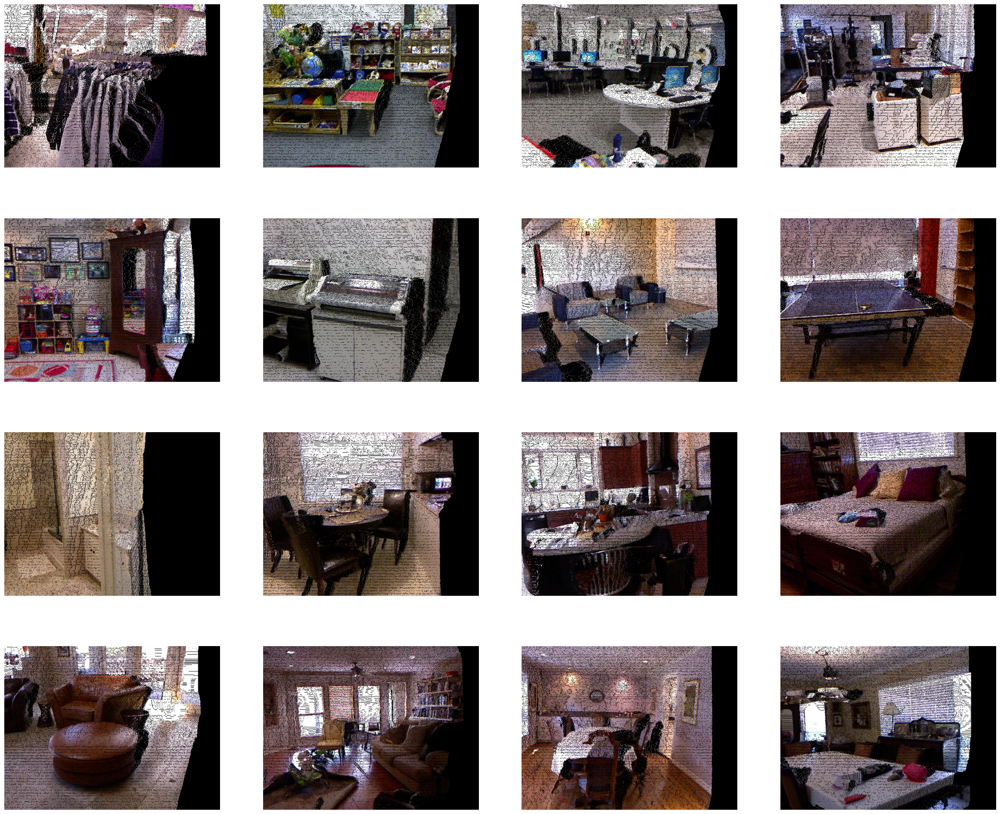

In [20]:
#visualize
fig = plt.figure(figsize=(30, 25.0))
for i in range(0, len(rgbs)):
    plt.subplot(4, 4, i + 1)
    plt.axis("off")
    plt.imshow(images_new[i][:, :, :3])